In [1]:
install.packages("git2r")
library(git2r)

clone("https://github.com/Jeferson0809/rayimage", local_path = "rayimage_git2r")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



cloning into 'rayimage_git2r'...
Receiving objects:   1% (12/1193),   15 kb
Receiving objects:  11% (132/1193),   64 kb
Receiving objects:  21% (251/1193), 1687 kb
Receiving objects:  31% (370/1193), 7656 kb
Receiving objects:  41% (490/1193), 7672 kb
Receiving objects:  51% (609/1193), 7706 kb
Receiving objects:  61% (728/1193), 14765 kb
Receiving objects:  71% (848/1193), 15642 kb
Receiving objects:  81% (967/1193), 18301 kb
Receiving objects:  91% (1086/1193), 28905 kb
Receiving objects: 100% (1193/1193), 29221 kb, done.


Local:    master /content/rayimage_git2r
Remote:   master @ origin (https://github.com/Jeferson0809/rayimage)
Head:     [ab180b6] 2025-06-07: Add files via upload

In [2]:
# To install the latest version from Github:
# install.packages("remotes")
remotes::install_github("Jeferson0809/rayimage")

RcppArmad... (NA -> 14.4.3-1) [CRAN]
tiff         (NA -> 0.1-12  ) [CRAN]
jpeg         (NA -> 0.1-11  ) [CRAN]
png          (NA -> 0.1-8   ) [CRAN]


Installing 4 packages: RcppArmadillo, tiff, jpeg, png

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/RtmpskP5UV/remotesb71e11fdc/Jeferson0809-rayimage-ab180b6/DESCRIPTION’ ... OK
* preparing ‘rayimage’:
* checking DESCRIPTION meta-information ... OK
* cleaning src
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
* building ‘rayimage_0.15.1.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [3]:
list.files("/content/")

[1] "rayimage_git2r" "sample_data"

In [4]:
list.files()

[1] "rayimage_git2r" "sample_data"

In [5]:
unzip("/content/rayimage_git2r/Fotos.zip", list = TRUE)  # listar contenido
unzip("/content/rayimage_git2r/Fotos.zip", exdir = "depths")  # extraer


Name,Length,Date
<chr>,<dbl>,<dttm>
depth_0.png,111195,2025-06-07 18:03:00
depth_1.png,80727,2025-06-07 18:03:00
depth_10.png,118794,2025-06-07 18:03:00
depth_11.png,64462,2025-06-07 18:03:00
depth_12.png,99731,2025-06-07 18:03:00
depth_13.png,77271,2025-06-07 18:03:00
depth_14.png,70524,2025-06-07 18:03:00
depth_15.png,62795,2025-06-07 18:03:00
depth_16.png,68932,2025-06-07 18:03:00


In [6]:

list.files("depths", recursive = TRUE)

[1] "depth_0.png"  "depth_1.png"  "depth_10.png" "depth_11.png" "depth_12.png"
 [6] "depth_13.png" "depth_14.png" "depth_15.png" "depth_16.png" "depth_17.png"
[11] "depth_18.png" "depth_19.png" "depth_2.png"  "depth_20.png" "depth_3.png" 
[16] "depth_4.png"  "depth_5.png"  "depth_6.png"  "depth_7.png"  "depth_8.png" 
[21] "depth_9.png"  "img_0.png"    "img_1.png"    "img_10.png"   "img_11.png"  
[26] "img_12.png"   "img_13.png"   "img_14.png"   "img_15.png"   "img_16.png"  
[31] "img_17.png"   "img_18.png"   "img_19.png"   "img_2.png"    "img_20.png"  
[36] "img_3.png"    "img_4.png"    "img_5.png"    "img_6.png"    "img_7.png"   
[41] "img_8.png"    "img_9.png"

In [7]:
install.packages("png")
install.packages("abind")
library(png)
library(abind)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



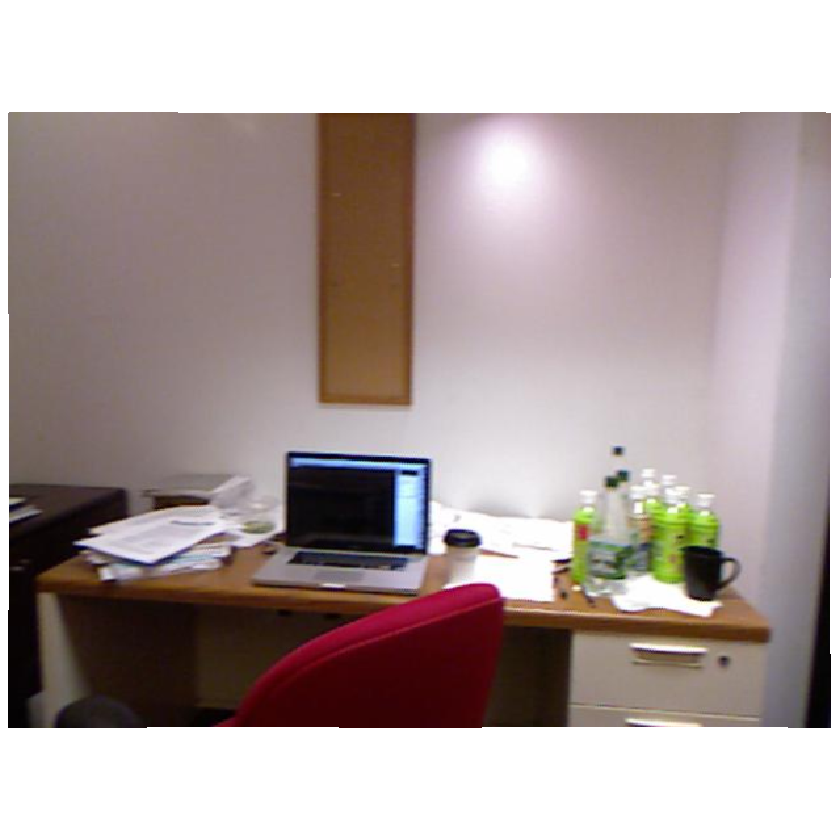

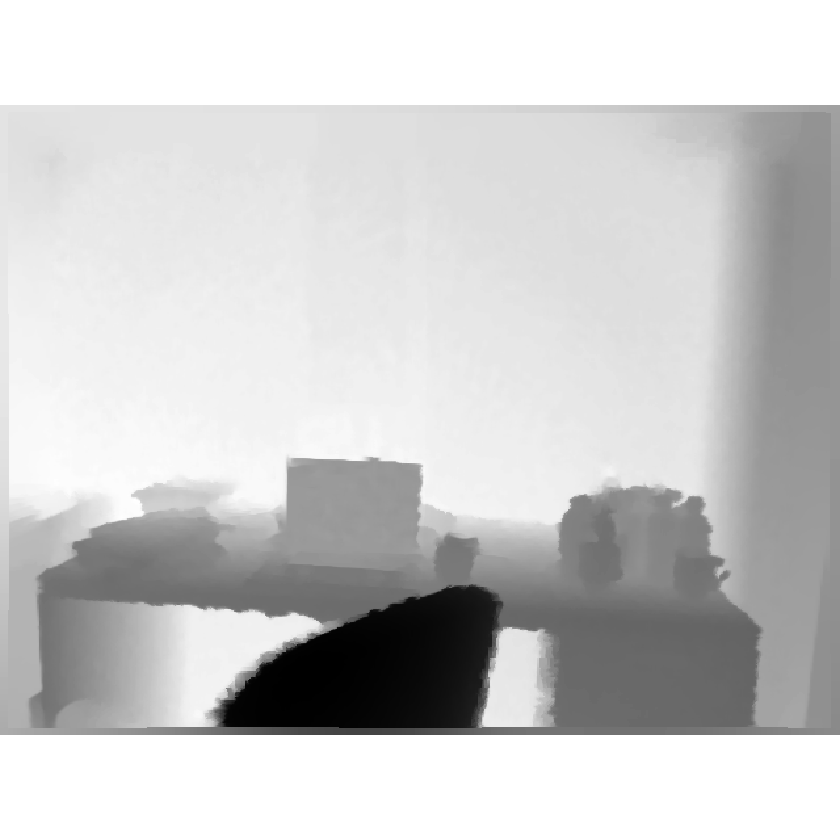

In [35]:
library(png)

data_dir <- "depths"

for (i in 0:20) {
  # Leer archivos
  img <- readPNG(file.path(data_dir, paste0("img_", i, ".png")))
  depth <- readPNG(file.path(data_dir, paste0("depth_", i, ".png")))

  # Asignar a variables dinámicamente: img0, depth0, etc.
  assign(paste0("img", i), img, envir = .GlobalEnv)
  assign(paste0("depth", i), depth, envir = .GlobalEnv)
}



plot_image(img3)
plot_image(depth3)


In [ ]:

install.packages("rayimage")
install.packages("png")
install.packages("zoo")

library(rayimage)
library(png)
library(zoo)


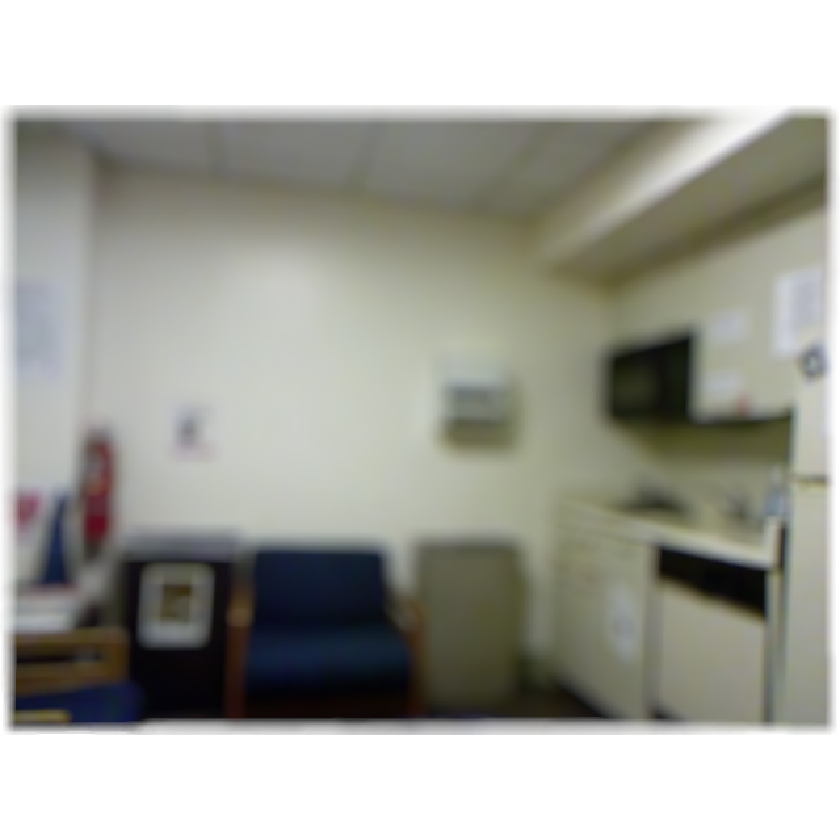

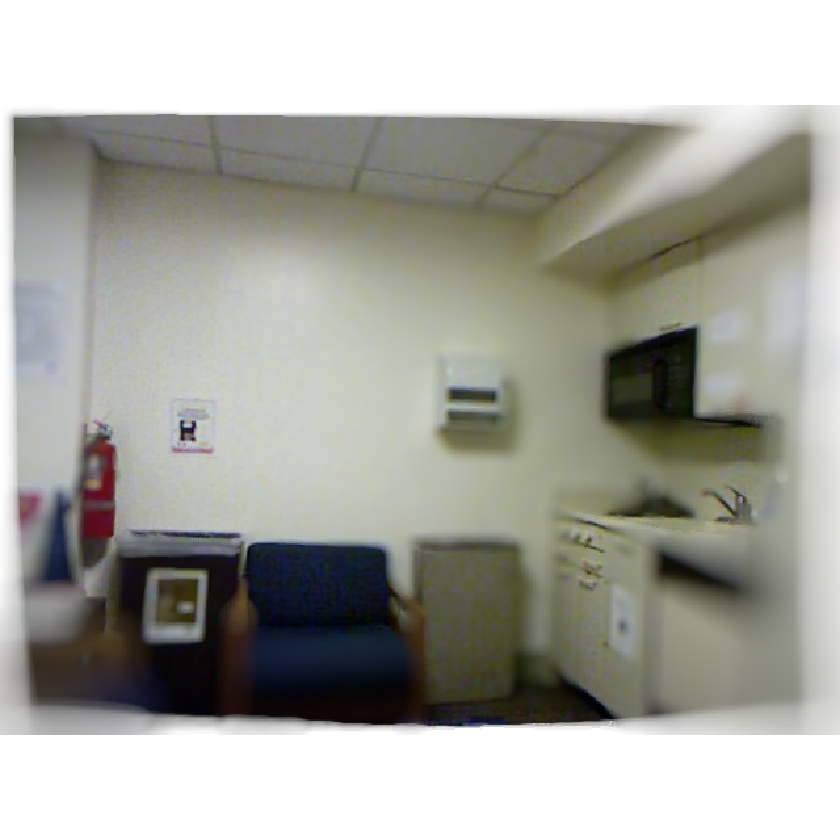

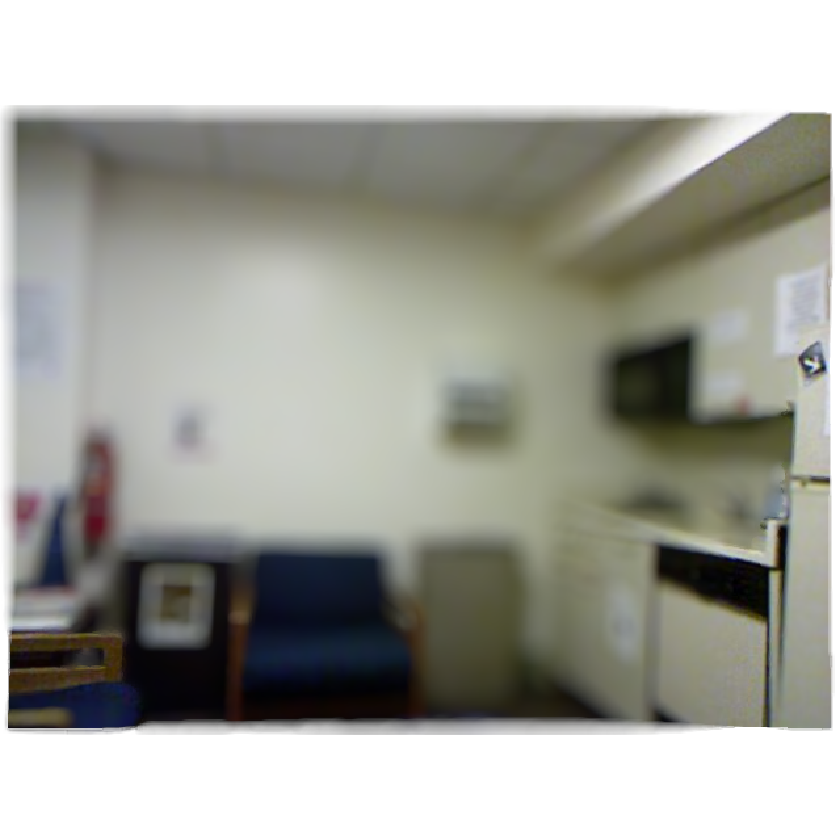

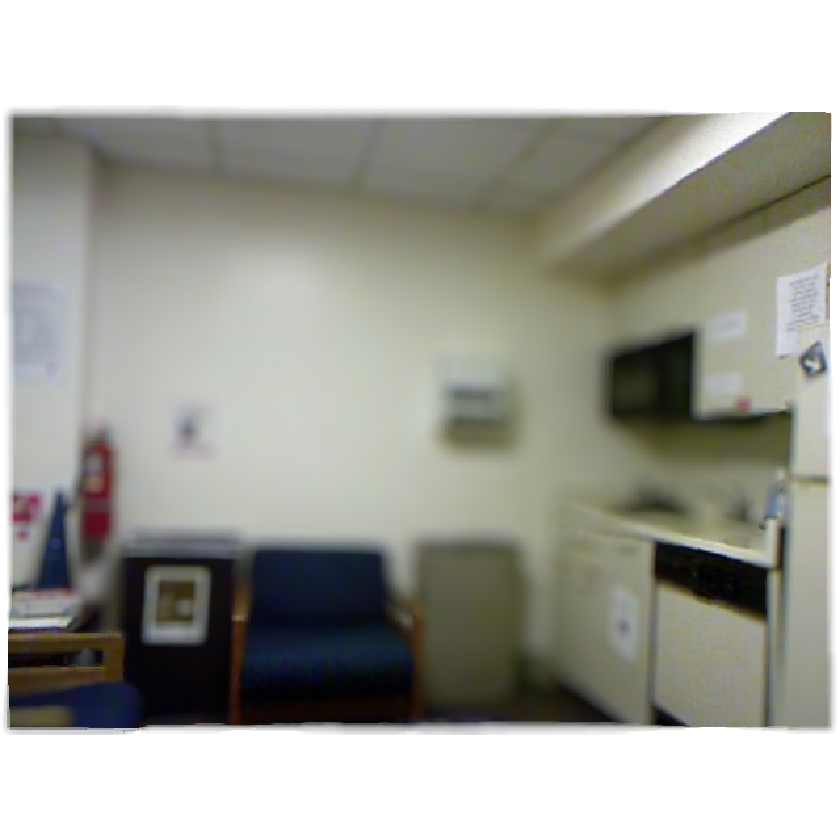

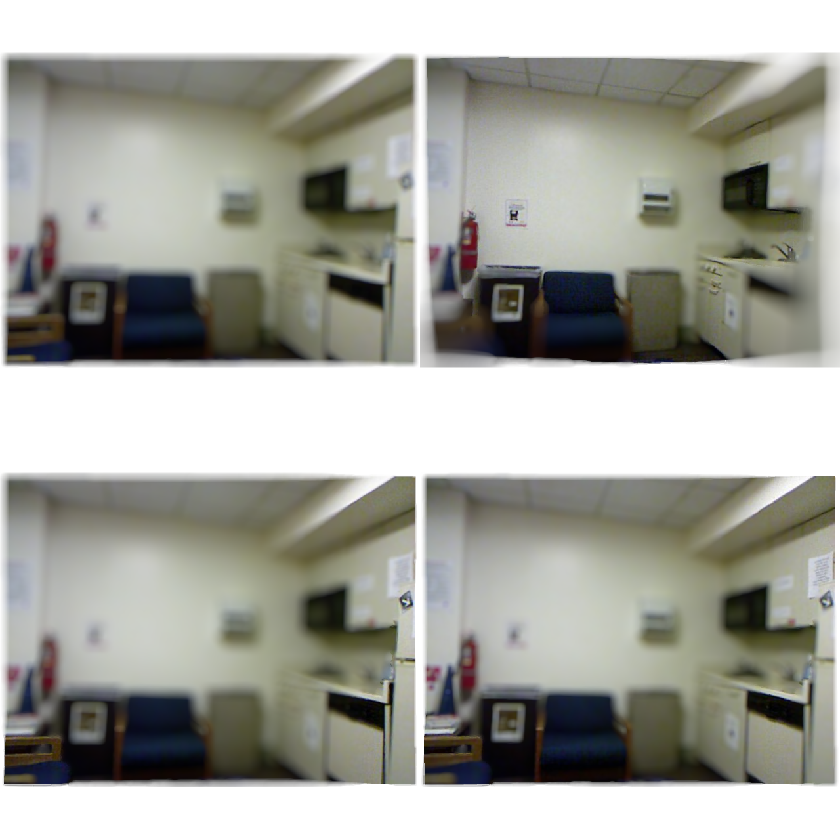

...

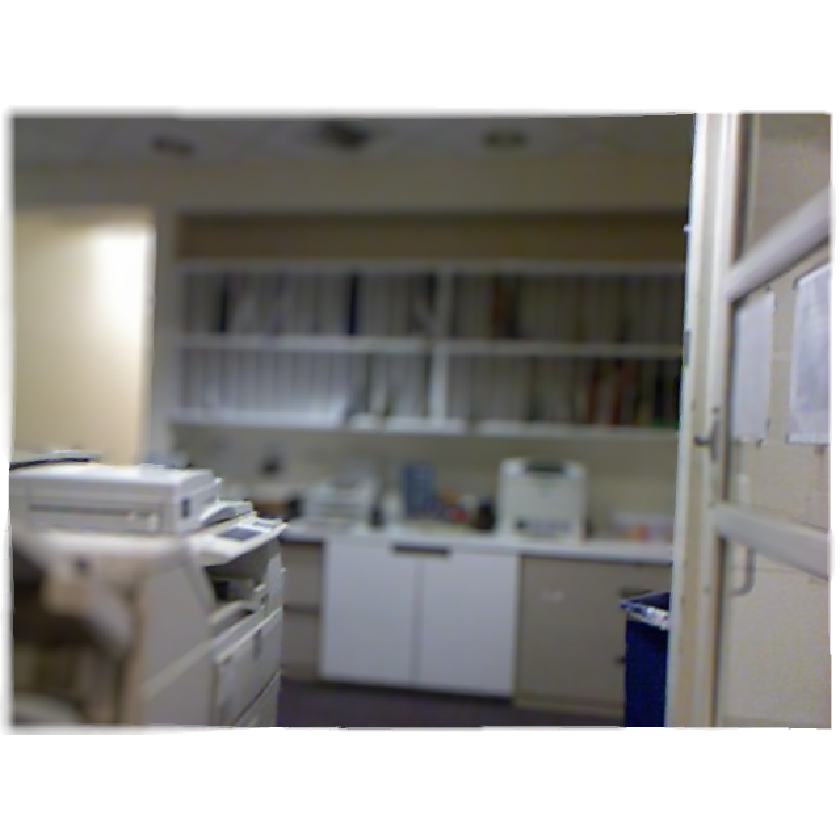

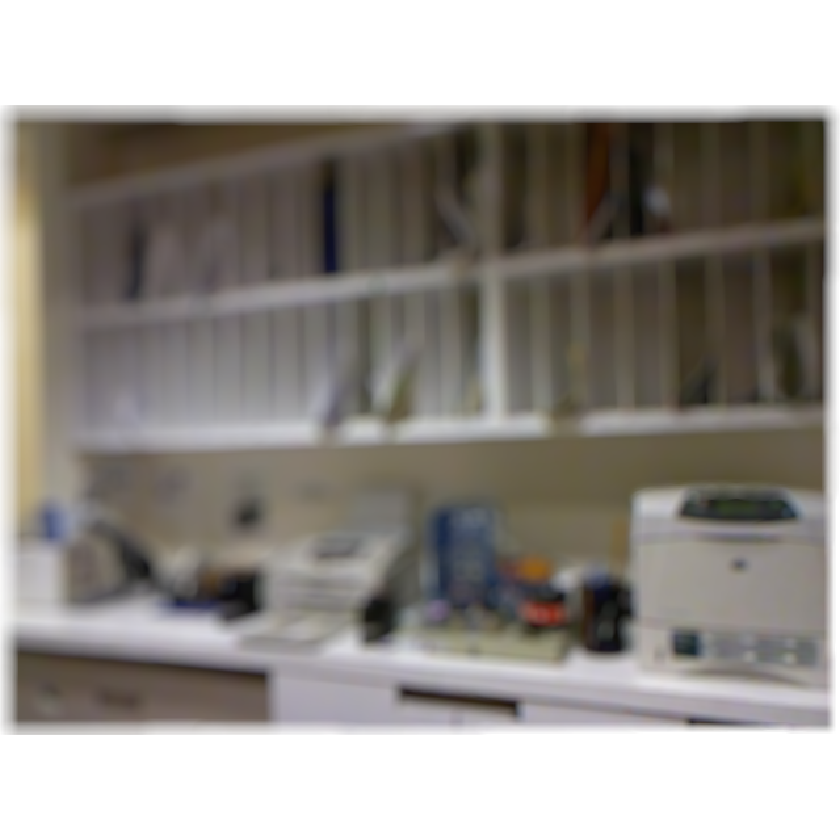

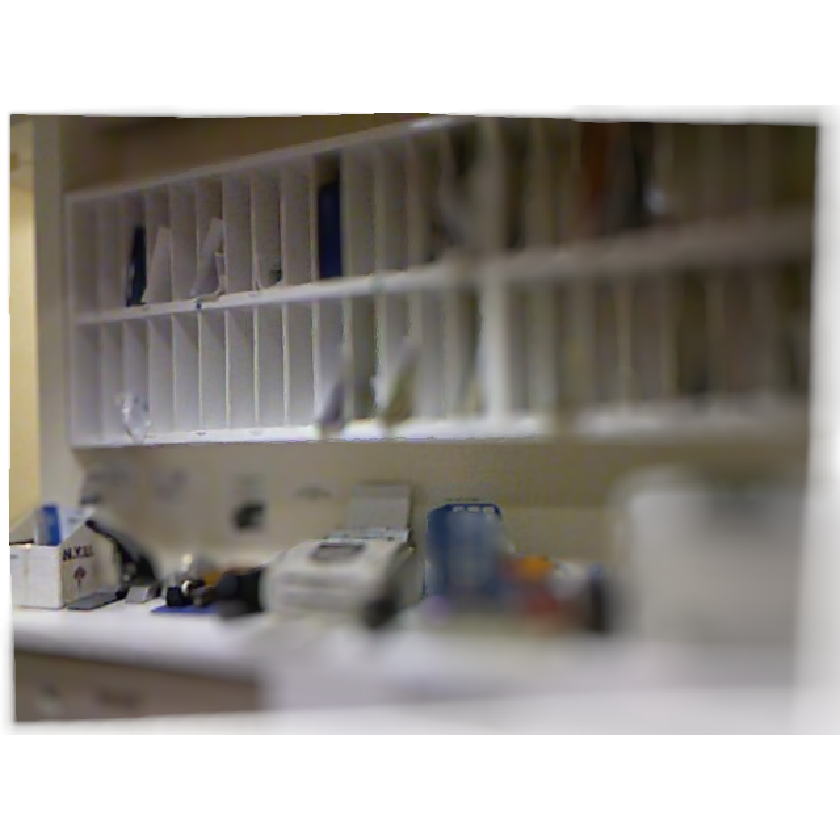

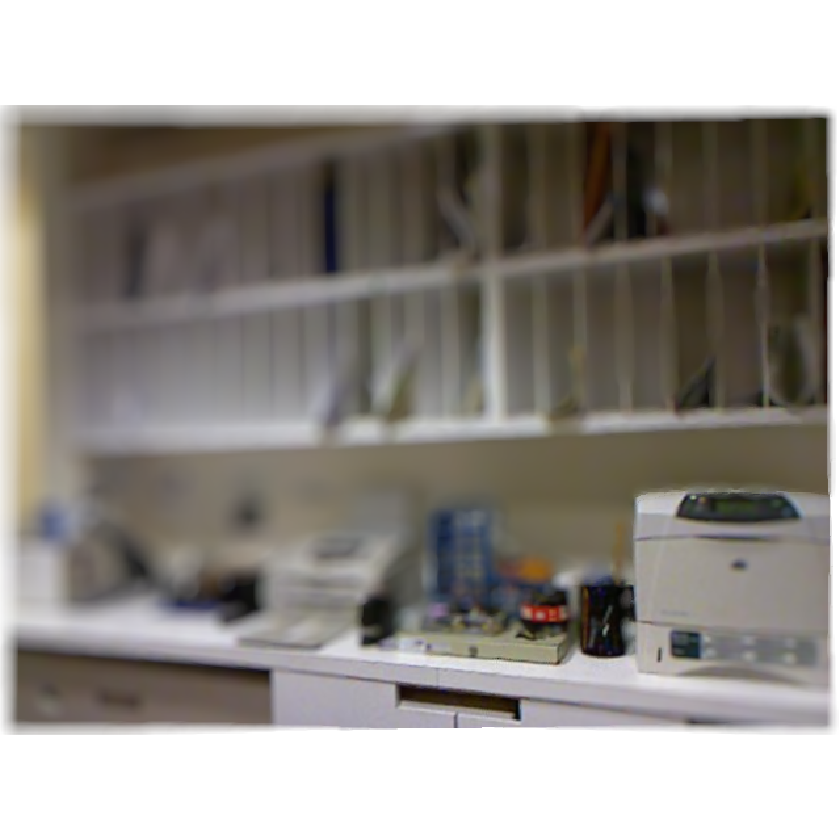

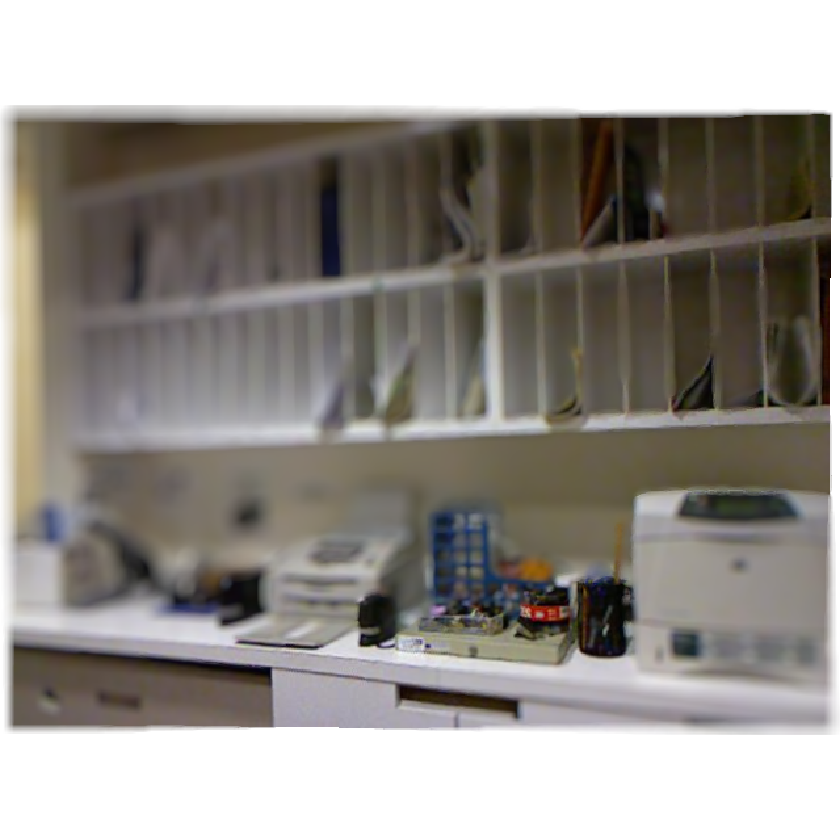

In [65]:
# Crear listas para almacenar resultados
bokeh_results <- list()

# Procesar cada par de imagen-depth del 0 al 20
for (i in 0:10) {
  # Obtener imagen y depth map dinámicamente
  img <- get(paste0("img", i))
  depth <- get(paste0("depth", i))

  # 1. Normalizar el mapa de profundidad
  depth_resized <- scales::rescale(depth, to = c(0.4, 1))  # Rango seguro

  # Aplicar kernel gaussiano
  kernel_matrix <- matrix(c(1, 2, 1, 2, 4, 2, 1, 2, 1)/16, nrow = 3)
  depth_smoothed <- render_convolution(depth_resized, kernel = kernel_matrix)

  # 2. Generar diferentes efectos bokeh para esta imagen
  image_variations <- list(
    # Enfoque en fondo
    render_bokeh(img, depth_smoothed, focus = 0.3, focallength = 250, fstop = 8),

    # Enfoque en primer plano
    render_bokeh(img, depth_smoothed, focus = 0.8, focallength = 350, bokehintensity = 3),

    # Enfoque medio
    render_bokeh(img, depth_smoothed, focus = 0.5, focallength = 150, fstop = 2.5),

    # Otra variación
    render_bokeh(img, depth_smoothed, focus = 0.55, focallength = 200)
  )

  # Almacenar resultados
  bokeh_results[[i+1]] <- image_variations

  # Opcional: guardar visualización para cada grupo de 4 imágenes
  if (i %% 4 == 0) {  # Cada 4 imágenes
    plot_image_grid(image_variations, dim = c(2, 2))
  }
}

# Estructura del resultado:
# bokeh_results es una lista donde cada elemento contiene las 4 variantes de bokeh para una imagen

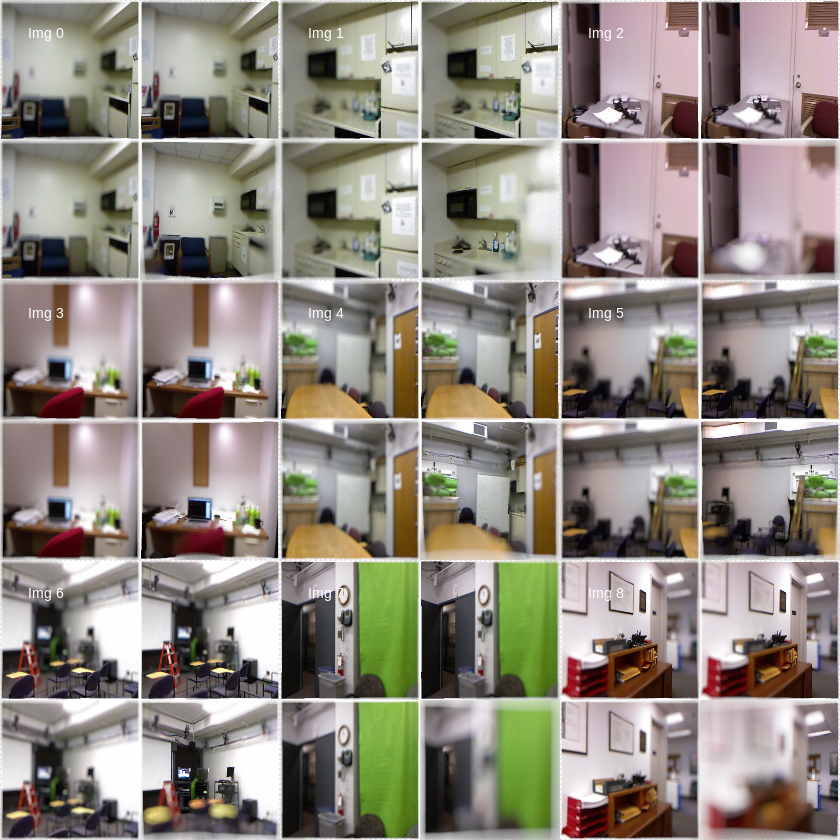

In [63]:
# Configuración inicial
par(mar = rep(0, 4), xaxs = "i", yaxs = "i")

# Crear plot vacío con dimensiones 3x3
plot(1, type = "n", xlim = c(0, 3), ylim = c(0, 3),
     axes = FALSE, xlab = "", ylab = "", asp = 1)

# Dibujar las 9 imágenes en disposición 3x3
for (img_group in 1:9) {
  row <- ((img_group - 1) %/% 3) + 1  # Filas (1-3)
  col <- ((img_group - 1) %% 3) + 1   # Columnas (1-3)

  # Posición del grupo (ajustada para centrar)
  group_x <- col - 1
  group_y <- 3 - row  # Invertir el eje Y para empezar desde arriba

  # Dibujar las 4 subimágenes del grupo
  for (subimg in 1:4) {
    subcol <- ((subimg - 1) %% 2)     # 0, 1 (columnas internas)
    subrow <- ((subimg - 1) %/% 2)     # 0, 1 (filas internas)

    rasterImage(
      bokeh_results[[img_group]][[subimg]],
      xleft   = group_x + subcol * 0.5,
      xright  = group_x + (subcol + 1) * 0.5,
      ybottom = group_y + subrow * 0.5,
      ytop    = group_y + (subrow + 1) * 0.5
    )
  }

  # Añadir etiqueta (opcional)
  text(
    x = group_x + 0.1,
    y = group_y + 0.9,
    labels = ifelse(exists("bokeh_names"),
                   bokeh_names[img_group],
                   paste0("Img ", img_group - 1)),
    adj = c(0, 1),
    cex = 0.7,
    col = "white"
  )
}

# Añadir rejilla (opcional)
abline(h = 0:3, v = 0:3, col = "gray80", lty = 3)

$$
I \in R^{H,W,C}\\
DOF \in R^{H,W,C,D}\\
DEPT \in R^{H,W}
$$